In [35]:
import pandas as pd
import numpy as np
import datetime as dt
import math
from keras.models import Sequential
from keras.layers import Dense, Activation, LocallyConnected2D, Flatten, Conv2D, MaxPooling2D
from keras.layers import Dropout
from keras import backend as K
#K.set_image_dim_ordering('th')
from keras.initializers import *
from keras.optimizers import *
from keras import regularizers
from keras.wrappers.scikit_learn import KerasClassifier
from keras.utils import np_utils
from sklearn.model_selection import train_test_split
import sklearn.preprocessing as pre
import os
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
os.environ["KMP_DUPLICATE_LIB_OK"]="True"
from mlxtend.evaluate import confusion_matrix 
from mlxtend.plotting import plot_confusion_matrix

In [36]:
data = pd.read_csv("H1B_case_Status.csv",low_memory=False) 

In [37]:
oldlist=data['CASE_NUMBER']

In [38]:
newlist=[]
for x in oldlist:
    x=x.replace('-','')
    newlist.append(x[1:])

In [39]:
data['CASE_NUMBER'] = np.array(newlist)

In [40]:
def convert_status_numeric(columns):
    #for x in columns[0]:
    if columns[0]=='CERTIFIED-WITHDRAWN':
        return 0
    elif columns[0]=='WITHDRAWN':
        return 1
    elif columns[0]=='CERTIFIED':
        return 2
    elif columns[0]=='DENIED':
        return 3

In [41]:
data['CASE_STATUS'] = data[['CASE_STATUS']].apply(convert_status_numeric,axis=1)

In [42]:
data['CASE_SUBMITTED']=pd.to_datetime(data['CASE_SUBMITTED'])
data['CASE_SUBMITTED']=pd.DataFrame((data['CASE_SUBMITTED'] - dt.datetime(1970,1,1)).dt.total_seconds())

In [43]:
data['DECISION_DATE']=pd.to_datetime(data['DECISION_DATE'])
data['DECISION_DATE']=pd.DataFrame((data['DECISION_DATE'] - dt.datetime(1970,1,1)).dt.total_seconds())

In [44]:
data=data.drop(['Unnamed: 0','VISA_CLASS','EMPLOYER_BUSINESS_DBA','EMPLOYER_COUNTRY','EMPLOYER_PROVINCE',
                'EMPLOYER_PHONE_EXT','EMPLOYER_ADDRESS','EMPLOYER_CITY','EMPLOYER_STATE','EMPLOYER_POSTAL_CODE',
               'AGENT_ATTORNEY_NAME','AGENT_ATTORNEY_CITY','AGENT_ATTORNEY_STATE','EMPLOYER_PHONE',
               'SOC_CODE','NAICS_CODE','PUBLIC_DISCLOSURE_LOCATION','WORKSITE_CITY','WORKSITE_COUNTY',
               'WORKSITE_STATE','WORKSITE_POSTAL_CODE','PW_SOURCE_OTHER','WAGE_RATE_OF_PAY_FROM',
               'WAGE_UNIT_OF_PAY'],axis=1)

In [45]:
data['EMPLOYMENT_START_DATE'] = data['EMPLOYMENT_START_DATE'].fillna(data['EMPLOYMENT_START_DATE'].mode()[0])
data['EMPLOYMENT_START_DATE']=pd.to_datetime(data['EMPLOYMENT_START_DATE'])
data['EMPLOYMENT_START_DATE']=pd.DataFrame((data['EMPLOYMENT_START_DATE'] - dt.datetime(1970,1,1)).dt.total_seconds())

In [46]:
data['EMPLOYMENT_END_DATE'] = data['EMPLOYMENT_END_DATE'].fillna(data['EMPLOYMENT_END_DATE'].mode()[0])
data['EMPLOYMENT_END_DATE']=pd.to_datetime(data['EMPLOYMENT_END_DATE'])
data['EMPLOYMENT_END_DATE']=pd.DataFrame((data['EMPLOYMENT_END_DATE'] - dt.datetime(1970,1,1)).dt.total_seconds())

In [47]:
data['EMPLOYER_NAME'] = data['EMPLOYER_NAME'].fillna(data['EMPLOYER_NAME'].mode()[0])

In [48]:
name_dict=data['EMPLOYER_NAME'].value_counts().to_dict()

In [49]:
new_dict={}
count=1
for key,value in name_dict.items():
    if value > 500:
        new_dict[key] = count
        count+=1
    else:
        new_dict[key] = 0

In [50]:
data['EMPLOYER_NAME'] = data['EMPLOYER_NAME'].apply(lambda x: new_dict.get(x))

In [51]:
def process_agent(columns):
    if columns[0]=='Y':
        return 1
    else:
        return 0

In [52]:
data['AGENT_REPRESENTING_EMPLOYER'] = data[['AGENT_REPRESENTING_EMPLOYER']].apply(process_agent,axis=1)

In [53]:
data['JOB_TITLE']=data['JOB_TITLE'].fillna(data['JOB_TITLE'].mode()[0])
title_dict=data['JOB_TITLE'].value_counts().to_dict()
new_dict={}
count=1
for key,value in title_dict.items():
    if value > 500:
        new_dict[key] = count
        count+=1
    else:
        new_dict[key] = 0

In [54]:
data['JOB_TITLE'] = data['JOB_TITLE'].apply(lambda x: new_dict.get(x))

In [55]:
data['JOB_TITLE'].isna().sum()

0

In [56]:

data['SOC_NAME'] = data['SOC_NAME'].fillna(data['SOC_NAME'].mode()[0])
data['SOC_NAME1'] = 'OTHERS'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('COMPUTER','SOFTWARE')] = 'IT'
data['SOC_NAME1'][data['SOC_NAME'].str.contains('OPERATIONS','WEB')] = 'IT'
data['SOC_NAME1'][data['SOC_NAME'].str.contains('ANALYSTS','SYSTEMS')] = 'IT'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('CHIEF','MANAGEMENT')] = 'MANAGER'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('MECHANICAL')] = 'MECHANICAL'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('DATABASE')] = 'DATABASE'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('DATABASE','MARKET')] = 'SALES'
data['SOC_NAME1'][data['SOC_NAME'].str.contains('DISTRIBUTION','LOGISTICS')] = 'SALES'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('FINANCIAL')] = 'FINANCE'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('PUBLIC','FUNDRAISING')] = 'PR'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('EDUCATION','LAW')] = 'ADMINISTRATIVE'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('AUDITORS','COMPLIANCE')] = 'AUDIT'


data['SOC_NAME1'][data['SOC_NAME'].str.contains('RECRUITERS','HUMAN')] = 'HR'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('AGRICULTURAL','FARM')] = 'AGRI'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('CONSTRUCTION','ARCHITECTURAL')] = 'ESTATE'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('FORENSIC','HEALTH')] = 'MEDICAL'
data['SOC_NAME1'][data['SOC_NAME'].str.contains('CLINICAL')] = 'MEDICAL'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('TEACHERS')] = 'EDUCATION'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('BIOLOGICAL','SCIENTISTS')] = 'SCIENCE'
data['SOC_NAME1'][data['SOC_NAME'].str.contains('SOIL','MATHEMATICIANS')] = 'SCIENCE'
data['SOC_NAME1'][data['SOC_NAME'].str.contains('PHARMACISTS')] = 'SCIENCE'

data['SOC_NAME1'][data['SOC_NAME'].str.contains('ELECTRICAL','ELECTRONICS')] = 'ENGINEER'
data['SOC_NAME1'][data['SOC_NAME'].str.contains('CIVIL','AEROSPACE')] = 'ENGINEER'
data=data.drop(['SOC_NAME'],axis=1)

/Users/apurvakatti/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/Users/apurvakatti/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/apurvakatti/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/Users/apurvakatti/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingW

In [57]:
def processTitle(columns):
    if columns[0]=='IT':
        return 1
    elif columns[0]=='MANAGER':
        return 2
    elif columns[0]=='MECHANICAL':
        return 3
    elif columns[0]=='DATABASE':
        return 4
    elif columns[0]=='SALES':
        return 5
    elif columns[0]=='FINANCE':
        return 6
    elif columns[0]=='PR':
        return 7
    elif columns[0]=='ADMINISTRATIVE':
        return 8
    elif columns[0]=='AUDIT':
        return 9
    elif columns[0]=='HR':
        return 10
    elif columns[0]=='AGRI':
        return 11
    elif columns[0]=='ESTATE':
        return 12
    elif columns[0]=='MEDICAL':
        return 13
    elif columns[0]=='EDUCATION':
        return 14
    elif columns[0]=='SCIENCE':
        return 15
    elif columns[0]=='ENGINEER':
        return 16
    else:
        return 0

In [58]:
data['SOC_NAME1'] = data[['SOC_NAME1']].apply(processTitle,axis=1)

In [59]:
def process_position(columns):
    if columns[0]=='N':
        return 0
    else:
        return 1

In [60]:
data['FULL_TIME_POSITION']=data['FULL_TIME_POSITION'].fillna(data['FULL_TIME_POSITION'].mode()[0])
data['FULL_TIME_POSITION'] = data[['FULL_TIME_POSITION']].apply(process_position,axis=1)

data['WILLFUL_VIOLATOR']=data['WILLFUL_VIOLATOR'].fillna(data['WILLFUL_VIOLATOR'].mode()[0])
data['WILLFUL_VIOLATOR']=data[['WILLFUL_VIOLATOR']].apply(process_position,axis=1)

data['H1B_DEPENDENT']=data['H1B_DEPENDENT'].fillna(data['H1B_DEPENDENT'].mode()[0])
data['H1B_DEPENDENT']=data[['H1B_DEPENDENT']].apply(process_position,axis=1)

data['SUPPORT_H1B']=data['SUPPORT_H1B'].fillna(data['SUPPORT_H1B'].mode()[0])
data['SUPPORT_H1B']=data[['SUPPORT_H1B']].apply(process_position,axis=1)

data['LABOR_CON_AGREE']=data['LABOR_CON_AGREE'].fillna(data['LABOR_CON_AGREE'].mode()[0])
data['LABOR_CON_AGREE']=data[['LABOR_CON_AGREE']].apply(process_position,axis=1)


In [61]:
data['ORIGINAL_CERT_DATE'] = data['ORIGINAL_CERT_DATE'].fillna(data['ORIGINAL_CERT_DATE'].mode()[0])
data['ORIGINAL_CERT_DATE']=pd.to_datetime(data['ORIGINAL_CERT_DATE'])
data['ORIGINAL_CERT_DATE']=pd.DataFrame((data['ORIGINAL_CERT_DATE'] - dt.datetime(1970,1,1)).dt.total_seconds())

In [62]:
#data['PREVAILING_WAGE'].isna().sum()
data['PW_UNIT_OF_PAY']=data['PW_UNIT_OF_PAY'].fillna(data['PW_UNIT_OF_PAY'].mode()[0])
data['PREVAILING_WAGE']=data['PREVAILING_WAGE'].fillna(data['PREVAILING_WAGE'].mode()[0])

In [63]:
def process_wages(columns):
    if columns[1]=='Hour':
        value=(int(columns[0])*8*5*52)
        return int(value)
    elif columns[1]=='Week':
        value=(int(columns[0])*52)
        return int(value)
    elif columns[1]=='Biweekly':
        value=(int(columns[0])*26)
        return int(value)
    elif columns[1]=='Month':
        value= (int(columns[0])*12)
        return int(value)
    else:
        return int(columns[0])

In [64]:
#column_name=data['PW_UNIT_OF_PAY']
data['PREVAILING_WAGE']=data[['PREVAILING_WAGE','PW_UNIT_OF_PAY']].apply(process_wages,axis=1)

In [65]:
pd.set_option('display.max_columns', None)
data.head(n=25)

,CASE_NUMBER,CASE_STATUS,CASE_SUBMITTED,DECISION_DATE,EMPLOYMENT_START_DATE,EMPLOYMENT_END_DATE,EMPLOYER_NAME,AGENT_REPRESENTING_EMPLOYER,JOB_TITLE,TOTAL_WORKERS,NEW_EMPLOYMENT,CONTINUED_EMPLOYMENT,CHANGE_PREVIOUS_EMPLOYMENT,NEW_CONCURRENT_EMPLOYMENT,CHANGE_EMPLOYER,AMENDED_PETITION,FULL_TIME_POSITION,PREVAILING_WAGE,PW_UNIT_OF_PAY,PW_WAGE_LEVEL,PW_SOURCE,PW_SOURCE_YEAR,WAGE_RATE_OF_PAY_TO,H1B_DEPENDENT,WILLFUL_VIOLATOR,SUPPORT_H1B,LABOR_CON_AGREE,ORIGINAL_CERT_DATE,SOC_NAME1
0,20016055173457,0,1.456272e+09,1.475280e+09,1.470787e+09,1.565395e+09,0,1,0,1,1,0,0,0,0,0,1,59197,Year,Level I,OES,2015.0,67320.0,0,0,1,1,1.456790e+09,1
1,20016064557834,0,1.457050e+09,1.475280e+09,1.471306e+09,1.565914e+09,0,1,96,1,1,0,0,0,0,0,1,49800,Year,NaN,Other,2015.0,57200.0,0,0,1,1,1.457395e+09,1
2,20016063996093,0,1.457568e+09,1.475280e+09,1.473379e+09,1.567987e+09,0,1,0,2,2,0,0,0,0,0,1,76502,Year,Level II,OES,2015.0,0.0,1,0,1,1,1.458086e+09,1
3,20016272196340,1,1.475021e+09,1.475280e+09,1.485389e+09,1.579910e+09,0,0,11,1,1,0,0,0,0,0,1,90376,Year,Level III,OES,2016.0,0.0,1,0,1,1,1.489622e+09,1
4,20015053636744,0,1.424563e+09,1.475366e+09,1.425168e+09,1.519862e+09,0,1,0,1,0,0,0,0,1,0,1,116605,Year,Level III,OES,2015.0,0.0,0,0,1,1,1.424909e+09,1
5,20015071336195,0,1.426118e+09,1.475366e+09,1.441930e+09,1.536624e+09,0,1,0,1,1,0,0,0,0,0,1,59405,Year,Level III,OES,2015.0,0.0,0,0,1,1,1.426637e+09,6
6,20016056842817,0,1.456358e+09,1.475366e+09,1.472083e+09,1.566605e+09,0,0,26,1,1,0,0,0,0,0,1,52915,Year,Level I,Other,2015.0,0.0,1,0,1,1,1.456877e+09,1
7,20016056757335,0,1.456358e+09,1.475366e+09,1.472170e+09,1.566691e+09,0,0,1,1,1,0,0,0,0,0,1,51730,Year,Level I,Other,2015.0,0.0,1,0,1,1,1.456877e+09,1
8,20016058469533,0,1.456531e+09,1.475366e+09,1.472170e+09,1.566691e+09,0,0,1,1,1,0,0,0,0,0,1,58053,Year,Level I,Other,2015.0,0.0,1,0,1,1,1.456963e+09,1
9,20016059084066,0,1.456618e+09,1.475366e+09,1.472429e+09,1.566778e+09,0,0,55,1,1,0,0,0,0,0,1,46821,Year,Level I,Other,2015.0,0.0,1,0,1,1,1.456963e+09,1


In [66]:
data=data.drop(['PW_UNIT_OF_PAY'],axis=1)

In [67]:
data['PW_WAGE_LEVEL']=data['PW_WAGE_LEVEL'].fillna(data['PW_WAGE_LEVEL'].mode()[0])

In [68]:
data['PW_WAGE_LEVEL'].value_counts()

Level I      345568
Level II     179435
Level III     62921
Level IV      36726
Name: PW_WAGE_LEVEL, dtype: int64

In [69]:
def processWageLevel(columns):
    if columns[0]=='Level I':
        return 1
    elif columns[0]=='Level II':
        return 2
    elif columns[0]=='Level III':
        return 3
    elif columns[0]=='Level IV':
        return 4

In [70]:
data['PW_WAGE_LEVEL']=data[['PW_WAGE_LEVEL']].apply(processWageLevel,axis=1)

In [71]:
def processSource(columns):
    if columns[0]=='OES':
        return 1
    elif columns[0]=='CBA':
        return 2
    elif columns[0]=='DBA':
        return 3
    elif columns[0]=='SCA':
        return 4
    else:
        return 0

In [72]:
data['PW_SOURCE']=data['PW_SOURCE'].fillna(data['PW_SOURCE'].mode()[0])
data['PW_SOURCE']=data[['PW_SOURCE']].apply(processSource,axis=1)

In [73]:
data['PW_SOURCE_YEAR']=data['PW_SOURCE_YEAR'].fillna(data['PW_SOURCE_YEAR'].mode()[0])

In [74]:
data['WAGE_RATE_OF_PAY_TO']=data['WAGE_RATE_OF_PAY_TO'].fillna(data['WAGE_RATE_OF_PAY_TO'].mode()[0])
#data['WAGE_UNIT_OF_PAY']=data['WAGE_UNIT_OF_PAY'].fillna(data['WAGE_UNIT_OF_PAY'].mode()[0])

In [75]:
data.isna().sum()

CASE_NUMBER                    0
CASE_STATUS                    0
CASE_SUBMITTED                 0
DECISION_DATE                  0
EMPLOYMENT_START_DATE          0
EMPLOYMENT_END_DATE            0
EMPLOYER_NAME                  0
AGENT_REPRESENTING_EMPLOYER    0
JOB_TITLE                      0
TOTAL_WORKERS                  0
NEW_EMPLOYMENT                 0
CONTINUED_EMPLOYMENT           0
CHANGE_PREVIOUS_EMPLOYMENT     0
NEW_CONCURRENT_EMPLOYMENT      0
CHANGE_EMPLOYER                0
AMENDED_PETITION               0
FULL_TIME_POSITION             0
PREVAILING_WAGE                0
PW_WAGE_LEVEL                  0
PW_SOURCE                      0
PW_SOURCE_YEAR                 0
WAGE_RATE_OF_PAY_TO            0
H1B_DEPENDENT                  0
WILLFUL_VIOLATOR               0
SUPPORT_H1B                    0
LABOR_CON_AGREE                0
ORIGINAL_CERT_DATE             0
SOC_NAME1                      0
dtype: int64

In [76]:
dataOutput=pd.DataFrame(data['CASE_STATUS'])
data=data.drop(['CASE_STATUS'],axis=1)

In [77]:
dataOutput

,CASE_STATUS
0,0
1,0
2,0
3,1
4,0
5,0
6,0
7,0
8,0
9,0


In [78]:
trainingData_X, testingData_X, trainingData_Y, testingData_Y = train_test_split(data,
                                                                                dataOutput,
                                                                                test_size = 0.33,
                                                                                random_state=5)

In [79]:
testingData_Y

,CASE_STATUS
171829,2
527531,2
140834,2
257680,2
528132,0
81567,2
160360,2
567212,2
76145,2
322078,2


In [80]:
scaler = pre.MinMaxScaler(feature_range=(0,1))
x_train=trainingData_X.values

intermediate=scaler.fit(x_train)
x_train=scaler.transform(x_train)

/Users/apurvakatti/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


In [81]:
x_test=testingData_X.values

intermediate=scaler.fit(x_test)
x_test=scaler.transform(x_test)

/Users/apurvakatti/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


In [82]:
y_train=trainingData_Y.values
y_test=testingData_Y.values

In [83]:
x_train=x_train.astype('float32')
y_train=y_train.astype('float32')
x_test=x_test.astype('float32')
y_test=y_test.astype('float32')

In [84]:
y_train = np_utils.to_categorical(y_train)
y_test = np_utils.to_categorical(y_test)

In [85]:
y_train

array([[0., 0., 1., 0.],
       [0., 0., 1., 0.],
       [0., 0., 1., 0.],
       ...,
       [0., 0., 1., 0.],
       [1., 0., 0., 0.],
       [0., 0., 1., 0.]], dtype=float32)

In [86]:
x_train.shape[1]

27

In [87]:
model=Sequential()
model.add(Dense(256, input_dim=x_train.shape[1], activation='relu',kernel_initializer=glorot_normal(seed=None),
               bias_initializer=Constant(value=0)))
model.add(Dropout(0.2))
model.add(Dense(128,activation='tanh', kernel_initializer=he_normal(seed=None),
                bias_initializer=Constant(value=0)))

model.add(Dense(64,activation='relu',kernel_initializer=he_normal(seed=None),
                bias_initializer=Constant(value=0)))

model.add(Dropout(0.2))
model.add(Dense(4, activation='softmax'))

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [88]:
model.compile(loss='categorical_crossentropy', optimizer='SGD',metrics=['accuracy'])

In [89]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 256)               7168      
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 128)               32896     
_________________________________________________________________
dense_3 (Dense)              (None, 64)                8256      
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_4 (Dense)              (None, 4)                 260       
Total params: 48,580
Trainable params: 48,580
Non-trainable params: 0
_________________________________________________________________


In [90]:
history=model.fit(x_train, y_train, validation_split=0.1, epochs=10)

Instructions for updating:
Use tf.cast instead.
Train on 376663 samples, validate on 41852 samples
Epoch 1/10
376663/376663 [==============================] - 62s 164us/step - loss: 0.3921 - acc: 0.9036 - val_loss: 0.3255 - val_acc: 0.9211
Epoch 2/10
376663/376663 [==============================] - 64s 169us/step - loss: 0.3285 - acc: 0.9237 - val_loss: 0.3009 - val_acc: 0.9304
Epoch 3/10
376663/376663 [==============================] - 59s 158us/step - loss: 0.3129 - acc: 0.9268 - val_loss: 0.2887 - val_acc: 0.9316
Epoch 4/10
376663/376663 [==============================] - 58s 153us/step - loss: 0.3024 - acc: 0.9294 - val_loss: 0.3252 - val_acc: 0.9247
Epoch 5/10
376663/376663 [==============================] - 63s 166us/step - loss: 0.2929 - acc: 0.9329 - val_loss: 0.2855 - val_acc: 0.9329
Epoch 6/10
376663/376663 [==============================] - 63s 166us/step - loss: 0.2855 - acc: 0.9347 - val_loss: 0.2728 - val_acc: 0.9378
Epoch 7/10
376663/376663 [=============================

In [91]:
scores = model.evaluate(x_test, y_test)

206135/206135 [==============================] - 7s 36us/step


In [92]:
print("Accuracy of the Model is: %.2f%% " % (scores[1]*100))

Accuracy of the Model is: 94.44% 


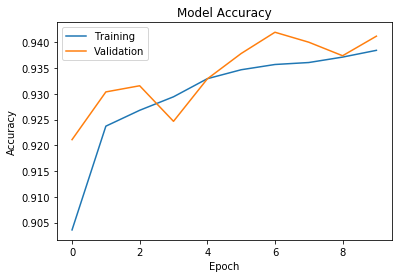

In [93]:
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='upper left')
plt.show()

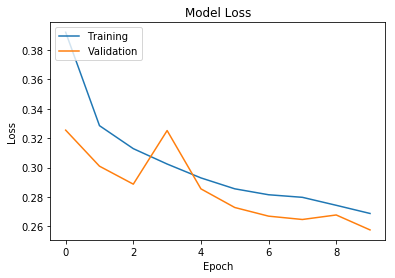

In [94]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Training', 'Validation'], loc='upper left')
plt.show()

In [95]:
print("Training complete...")
np.set_printoptions(precision=2,suppress=True)
for i in range(len(x_test)):
    print("Prediction: " + str(model.predict([x_test[i].reshape(1,x_test[i].shape[0])])) + " | True: " + str(y_test[i]))

Training complete...
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.05 0.76 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.82 0.11 0.06 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.97 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Predictio

Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.84 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.79 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.73 0.26 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.11 0.71 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.05 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.79 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.07 0.78 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.24 0.05 0.68 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.05 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.02 0.06 0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.01 0.04 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.77 0.15]] | True: [0. 0. 0. 1.]
Prediction: [[0.25 0.74 0.01 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.3  0.09 0.59 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.84 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.48 0.05 0.46 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.05 0.06 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.03 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.04 0.77 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.26 0.04 0.68 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.63 0.06 0.31 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.95 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.78 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.04 0.75 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.81 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.87 0.08 0.04 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.03 0.8  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.06 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.05 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.81 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | 

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.05 0.79 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.01 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.31 0.06 0.62 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.79 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.04 0.76 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.11 0.89 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.05 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.05 0.79 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0

Prediction: [[0.26 0.04 0.69 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.61 0.16 0.21 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.11 0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.04 0.76 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0

Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.12 0.66 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.71 0.07 0.22 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.78 0.14]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0.

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.89 0

Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.98 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.12 0.69 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.06 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.05 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.07 0.79 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.05 0.77 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.09 0.04 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.08 0.79 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.84 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.07 0.69 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0

Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.82 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.07 0.73 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.06 0.72 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.09 0.05 0.82 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.81 0.05]] | 

Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.77 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.06 0.94 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.12 0.04 0.79 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.16 0.04 0.75 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0

Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.12 0.03 0.84 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.81 0.19 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.07 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.05 0.81 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.79 0.08 0.13 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.1  0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.01 0.8  0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.85 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | 

Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.07 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.07 0.82 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.83 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.72 0.03 0.23 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.8  0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0

Prediction: [[0.01 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.53 0.2  0.24 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.07 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.85 0.14 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.05 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.79 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.1  0.04 0.85 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.06 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.83 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | 

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.82 0.06]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.93 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.84 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.11 0.05 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.27 0.01 0.72 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.52 0.14 0.32 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.85 0.02 0.12 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.87 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.81 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.16 0.01 0.82 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.75 0.02 0.23 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.11 0.74 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.36 0.06 0.57 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.08 0.66 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.56 0.1  0.32 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.03]] | 

Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0

Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.99 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.63 0.03 0.33 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.89 0.1  0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.8  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0

Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.77 0.15]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.86 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.01 0.89 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.87 0.13 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.03 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.1  0.06 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.03 0.82 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.52 0.03 0.43 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.08 0.0

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.05 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.84 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.83 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.   0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.79 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.05 0.77 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.75 0.11 0.13 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.89 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.04 0.79 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.82 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | 

Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.08 0.84 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.8  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.02 0.79 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.75 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.79 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.05 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.34 0.01 0.64 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.13 0.04 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.02 0.81 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.82 0.12 0.05 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.8  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.84 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.07 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.1  0.73 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.12 0.14 0.68 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.47 0.09 0.39 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.04 0.78 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.08 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.94 0.01]] | 

Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.01 0.9  0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.93 0

Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.37 0.09 0.51 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.78 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.81 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | 

Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.02 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.09 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.07 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.4  0.04 0.55 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | 

Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.84 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.69 0.08 0.21 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.05 0.82 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.8  0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.85 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.84 0.11]] | True: [0. 1. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0.

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.07 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.78 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.05 0.74 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.81 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.82 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.06 0.76 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.81 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.07 0.78 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.04 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.34 0.06 0.58 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.84 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.02 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.06 0.77 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.01 0.05 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.06 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.29 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.43 0.05 0.51 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.86 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0

Prediction: [[0.1  0.06 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.04 0.05 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.89 0.11 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.14 0.66 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.06 0.86 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.9  0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.01 0.82 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.98 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.78 0.22 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.79 0.07 0.12 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.05 0.82 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.69 0.03 0.27 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0

Prediction: [[0.04 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.65 0.03 0.31 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.09 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.79 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.35 0.64 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.08 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.91 0.08 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.06 0.78 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.33 0.1  0.53 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.05 0.75 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.06 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.88 0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.8  0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.92 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.59 0.12 0.26 0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.89 0.08 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.87 0.05 0.06 0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.05 0.74 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.81 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.27 0.06 0.65 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.03 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.55 0.07 0.35 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.04 0.76 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.0

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | 

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.78 0.22 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.83 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.89 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.84 0.14 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.05 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.88 0.03 0.08 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.83 0.16 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.91 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.9  0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.89 0.1  0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.8  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.7  0.06 0.24 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.83 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.06 0.84 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.06 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.03 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.06 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.98 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.78 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.12 0.76 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.3  0.02 0.66 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0

Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.85 0.14 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.38 0.12 0.46 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.27 0.04 0.68 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.9 0.1 0.  0. ]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.

Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.01 0.9  0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.9  0.02 0.07 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.07 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.8  0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.18 0.08 0.69 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.89 0

Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.04 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.73 0.11 0.14 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.82 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.82 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.08 0.04 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.49 0.03 0.47 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.84 0.15 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.05 0.79 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.83 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.06 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.18 0.12 0.64 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.78 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.08 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.83 0.11 0.05 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.04 0.85 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.04 0.84 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.05 0.77 0.07]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.83 0.05 0.11 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.51 0.08 0.4  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.05 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.81 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.09 0.7  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.04 0.77 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.85 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.99 0.   0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.07 0.04 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.27 0.05 0.66 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.07 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0.

Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0

Prediction: [[0.95 0.05 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.79 0.12]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.81 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.04 0.75 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.78 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.86 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.04 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.08 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.03 0.77 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.27 0.04 0.68 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.75 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.06 0.7  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.06 0.05 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.06 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.81 0.08 0.1  0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.07 0.81 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.08 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.04 0.78 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.16 0.02 0.8  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.05 0.73 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.14 0.05 0.77 0

Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.77 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.09 0.06 0.79 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.3  0.02 0.66 0.01]] | 

Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.05 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.8 0.2 0.  0. ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.05 0.74 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.81 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.91 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.74 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.16 0.05 0.74 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.08 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.81 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.04 0.91 0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.04 0.75 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0

Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.81 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.09 0.82 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.4  0.06 0.53 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.05 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | 

Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.77 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.09 0.79 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.58 0.07 0.32 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.95 0.01 0.04 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.08 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.06 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.07 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.78 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.05 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.12 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.08 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.78 0.15]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.09 0.04 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.03 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.06 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.79 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.81 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.06 0.71 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.01 0.88 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.07 0.68 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.05 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.01 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.85 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.   0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.41 0.13 0.44 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.07 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.77 0.08 0.14 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.85 0.15 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.23 0.03 0.73 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.05 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.92 0.05 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.05 0.77 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.93 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.08 0.06 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.91 0.02 0.07 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.05 0.81 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.06 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | 

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.78 0.12]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.08 0.69 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.06 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.96 0.01 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.12 0.11 0.71 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.27 0.07 0.6  0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.05 0.79 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.07 0.02 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.03 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.06 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.11 0.05 0.79 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0

Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.84 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.06 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.08 0.78 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.07 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.39 0.12 0.43 0.06]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0

Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.74 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.72 0.08 0.2  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.05 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.1  0.02 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.25 0.03 0.71 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.06 0.82 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.82 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.07 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.52 0.48 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.08 0.72 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.79 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.08 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.07 0.79 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.06 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.87 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.96 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.04 0.79 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.06 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0

Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.82 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.11 0.05 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.1  0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.82 0.16 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.46 0.13 0.37 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.79 0.13]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.14 0.09 0.74 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.22 0.05 0.69 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.56 0.0

Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.61 0.08 0.29 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.21 0.05 0.7  0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.08 0.09 0.77 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.83 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.06 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | 

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.84 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.28 0.07 0.6  0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.8  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0

Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.84 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.94 0.05 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.74 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.79 0.03 0.18 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.86 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.76 0.13 0.11 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.05 0.74 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.41 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.82 0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.33 0.07 0.57 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.08 0.81 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.06 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.87 0.04 0.08 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.34 0.06 0.59 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.06 0.82 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.8  0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.05 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.84 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.0

Prediction: [[0.14 0.07 0.74 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.06 0.68 0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.82 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.8  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.26 0.74 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.82 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.87 0.07 0.06 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.91 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.83 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.05 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.27 0.03 0.69 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.98 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.74 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.74 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.06 0.73 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.04 0.9  0

Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.87 0.06 0.06 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.87 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.1  0.04 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.83 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.06 0.77 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.0

Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.86 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.08 0.05 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.04 0.75 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.07 0.79 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.06 0.85 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.07 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.94 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.05 0.78 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.08 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.94 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.03 0.88 0

Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.04 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.08 0.08 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.86 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.01 0.91 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.01 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.79 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.02 0.06 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.01 0.87 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.01 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.01 0.9  0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.84 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.8  0.18 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.87 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.8  0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.05 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.01 0.82 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.79 0.12]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.1  0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.06 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.81 0.08 0.11 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.09 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.79 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.85 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.13 0.04 0.78 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.16 0.64 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.2  0.07 0.68 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.83 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0

Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.14 0.05 0.76 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.07 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.1  0.03 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.1  0.79 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.06 0.8  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.86 0.09]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.05 0.76 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.05 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.07 0.8  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.57 0.43 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.82 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.07 0.68 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.01 0.1  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.05 0.76 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.06 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.32 0.17 0.47 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.85 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.84 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.83 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.1  0.7  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.85 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.04 0.04 0.87 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.88 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.8  0.08]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.04 0.92 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.09 0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.87 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.1  0.04 0.8  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.76 0.15 0.08 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.76 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.93 0.07 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.06 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.06 0.69 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.0

Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.15 0.07 0.74 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.05 0.82 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.89 0.06 0.04 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.06 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.09 0.05 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.05 0.77 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.18 0.05 0.75 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.1  0.72 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.06 0.75 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.12 0.05 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.84 0.08 0.07 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.12 0.88 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.92 0.04 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.01 0.89 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.48 0.02 0.48 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.17 0.05 0.73 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.08 0.71 0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.76 0.15 0.09 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.04 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.78 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.84 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.06 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.06 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.75 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.83 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.84 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.08 0.83 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.36 0.09 0.51 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.05 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.79 0.08 0.12 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.9  0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.72 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.05 0.8  0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.0

Prediction: [[0.24 0.03 0.72 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.04 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.04 0.84 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.06 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.0

Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.87 0.11 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.06 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.05 0.79 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.05 0.78 0.13]] | True: [0. 0. 0. 1.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.16 0.02 0.8  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.05 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.14 0.62 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.15 0.04 0.77 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.07 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.11 0.02 0.86 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.12 0.04 0.84 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.84 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.81 0.08]] | True: [0. 0. 0. 1.]
Prediction: [[

Prediction: [[0.05 0.04 0.78 0.13]] | True: [0. 0. 0. 1.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.01 0.88 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.86 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.88 0.08]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.13 0.68 0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.02]] | True: [0

Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.84 0.16 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.78 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.05 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.48 0.05 0.47 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.51 0.16 0.29 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0

Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.06 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.03 0.79 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.97 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.78 0.12 0.08 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | 

Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.08 0.84 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.89 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.86 0.08 0.06 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.29 0.09 0.6  0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.08 0.82 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.79 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.87 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.38 0.11 0.48 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.07 0.7  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.82 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.06 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.15 0.63 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.8  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.87 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.03 0.82 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.85 0.14 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.09 0.7  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.06 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.44 0.04 0.5  0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.84 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.04 0.76 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.06 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.12 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.04 0.76 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0

Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.15 0.07 0.72 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.12 0.05 0.78 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.93 0.07 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.89 0.1  0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.8  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.8  0.14 0.05 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.99 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.82 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.84 0.04]] | 

Prediction: [[0.06 0.02 0.92 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.07 0.8  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.04 0.77 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.06 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0

Prediction: [[0.01 0.04 0.86 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.07 0.71 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.8  0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.32 0.12 0.51 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.88 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.05 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.45 0.03 0.5  0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.08 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.05 0.75 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.05 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.77 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.78 0.12]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.77 0.15]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.77 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.77 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.01 0.04 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.79 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.04 0.76 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.95 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.0

Prediction: [[0.09 0.04 0.82 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.05 0.79 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.78 0.12]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.05 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.79 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.34 0.06 0.59 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.27 0.07 0.62 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.8  0.08]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.28 0.05 0.66 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.06 0.71 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.06 0.03 0.86 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.04 0.77 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.0

Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.79 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.6  0.05 0.34 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.81 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.25 0.03 0.71 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.3 0.7 0.  0. ]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.01 0.91 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.79 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.05 0.75 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.9  0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.78 0.12]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.05 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.38 0.12 0.46 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.76 0.23 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.04 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.18 0.08 0.69 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.13 0.06 0.76 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | 

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.12 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.94 0.06 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.89 0.08 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.0

Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.86 0.14 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.01 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.05 0.75 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.38 0.26 0.31 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.07 0.68 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.02 0.84 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.03 0.79 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.88 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.16 0.04 0.78 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.77 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0

Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.82 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.85 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.01 0.88 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.25 0.05 0.67 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.84 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.81 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.01 0.88 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.08 0.04 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.82 0.06]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.17 0.04 0.75 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.77 0.15]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.94 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.08 0.04 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.05 0.81 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.13 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0

Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.78 0.12]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.91 0.08 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.81 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.85 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.1  0.06 0.79 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.24 0.06 0.68 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.25 0.07 0.67 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.62 0.14 0.24 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.07 0.84 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.12 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.15 0.04 0.78 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.82 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.02 0.83 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.04 0.77 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.05 0.77 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.94 0.06 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.79 0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.09 0.66 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.03 0.76 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.92 0.05 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.25 0.0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.0

Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.1  0.02 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.04 0.77 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.83 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.03 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.05 0.76 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.85 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.84 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.15 0.02 0.81 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.83 0.16 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.27 0.04 0.68 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.82 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.86 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.09 0.79 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.01 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.79 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.01 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.8  0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.08 0.04 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.01 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0.05 0.04 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.06 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.01 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.05 0.79 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.01 0.91 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.84 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.87 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.1  0.66 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.68 0.11 0.2  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.06 0.7  0.04]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.96 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0

Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.85 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.04]] | 

Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.39 0.1  0.48 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.13 0.06 0.76 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.05 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.95 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.0

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.05 0.79 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.11 0.79 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.05 0.76 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0

Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.87 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.79 0.02 0.19 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.15 0.04 0.77 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0

Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.77 0.15]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.07 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.41 0.17 0.4  0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.07 0.74 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.77 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0.11 0.03 0.81 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.04 0.72 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.15 0.08 0.74 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.81 0.12 0.06 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.0

Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.05 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.33 0.08 0.55 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.92 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.05 0.79 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.78 0.13]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.01 0.89 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.37 0.07 0.55 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.07 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.05 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.06 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.91 0.09 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.06 0.84 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.06 0.73 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.84 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.08 0.74 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.05 0.85 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.12 0.04 0.79 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.8  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.1

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.85 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.06 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.07 0.74 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.11 0.03 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.99 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.98 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.06 0.71 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.52 0.08 0.4  0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.05 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.09 0.79 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.01 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.05 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.95 0.05 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.96 0.01 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.01 0.91 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.05 0.89 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.25 0.04 0.7  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.92 0.04 0.04 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.06 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.13 0.2  0.62 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.09 0.7  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.07 0.71 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.75 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.83 0.15 0.02 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.05 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.88 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.81 0.18 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.13 0.02 0.83 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.45 0.09 0.45 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.83 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.8  0.07]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.06 0.72 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.45 0.03 0.51 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.77 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.18 0.03 0.77 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.8  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.02 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.09 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.09 0.82 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.15 0.66 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.05 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.24 0.07 0.67 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.48 0.1  0.4  0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.16 0.62 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.05 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0

Prediction: [[0.09 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.89 0.11 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.05 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.0

Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.89 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | 

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[

Prediction: [[0.11 0.03 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.78 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.1  0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.87 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.11 0.04 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.46 0.04 0.49 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.81 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.73 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.06 0.75 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.24 0.01 0.74 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.74 0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0

Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.06 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.72 0.04 0.23 0

Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.48 0.13 0.37 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.05 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.84 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0

Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.06 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | 

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.89 0.05 0.05 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.79 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0

Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.78 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.82 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.08 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.22 0.07 0.67 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0.

Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.83 0.17 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.78 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.77 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.05 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.78 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.03 0.91 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.06 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.1  0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.03]] | 

Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.01 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.04 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.04 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.35 0.11 0.5  0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.78 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.06 0.75 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.89 0.1

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.01 0.83 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.89 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.03 0.82 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.79 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.14 0.65 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | 

Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.83 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.08 0.83 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.04 0.74 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.06 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.05 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.06 0.78 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.76 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.9  0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.89 0.06 0.05 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.82 0.17 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.12 0.06 0.82 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.06 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.13 0.03 0.81 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.82 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.05 0.77 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.06 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0

Prediction: [[0.09 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.03 0.75 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.1  0.04 0.8  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.06 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.83 0.02 0.15 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.09 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.07 0.67 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.04 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.82 0.03 0.14 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.04 0.88 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.88 0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.94 0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.19 0.61 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.06 0.72 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.13 0.08 0.76 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.08 0.71 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.0

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.11 0.07 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.79 0.07]] | True: [0. 0. 0. 1.]
Prediction: [[0.11 0.04 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.06 0.86 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.06 0.7  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.06 0.74 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.99 0.   0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.11 0.04 0.8  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.12 0.1  0.74 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.08 0.92 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.84 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.12 0.06 0.78 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.91 0.07 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0

Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.05 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.22 0.06 0.68 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.08 0.07 0.78 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.78 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.09 0.68 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.81 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.04 0.82 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.81 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.8  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.0

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.05 0.73 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.83 0.17 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.82 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0

Prediction: [[0.1  0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.81 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.06 0.88 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0

Prediction: [[0.05 0.09 0.78 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.01 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.0

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.87 0.09]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.04 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0

Prediction: [[0.07 0.06 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.82 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.13 0.03 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.09 0.79 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.22 0.05 0.67 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.79 0.03 0.17 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.89 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.29 0.06 0.63 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.06 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.17 0.06 0.71 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.05 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.31 0.1

Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.78 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.02 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.01 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.18 0.16 0.61 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.14 0.86 0.   0.  ]] | 

Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.02 0.87 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.01 0.91 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.05 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.01 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.01 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.86 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.79 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.2  0.09 0.66 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.05 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.08 0.69 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.06 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.06 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.02 0.79 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.54 0.12 0.32 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.01 0.79 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.83 0.07]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.1  0.7  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.86 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.01 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.0

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.11 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.97 0.01 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.07 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.9 0.1 0.  0. ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.82 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0

Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.87 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.13 0.77 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.8  0.15 0.04 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0

Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.06 0.82 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.04 0.79 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.86 0.1  0.04 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.84 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.06 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | 

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.35 0.08 0.53 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.08 0.66 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.02 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.   0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.03 0.04 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.85 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.06 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.05 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.05 0.72 0.11]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.06 0.76 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.08 0.05 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.11 0.07 0.77 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.08 0.8  0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.66 0.15 0.18 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.05 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.75 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.01 0.04 0.92 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.22 0.05 0.71 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.86 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.84 0.11 0.05 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.86 0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | 

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.22 0.07 0.68 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.09 0.7  0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.08 0.04 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.96 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.01 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.06 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.87 0.03 0.1  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.89 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.08 0.06 0.83 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.03 0.97 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.77 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.17 0.05 0.75 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.77 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.13 0.66 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.05 0.74 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.02 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.71 0.28 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.98 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.28 0.07 0.63 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0

Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.05 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.04 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.78 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.82 0.03 0.15 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.06 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.09 0.72 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.11 0.08 0.76 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.05 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.86 0.09]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.14 0.64 0

Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.01 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.81 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.79 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.8  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.82 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.29 0.07 0.61 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.01 0.91 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.35 0.07 0.57 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.13 0.04 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.44 0.04 0.52 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.07 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.05 0.79 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.78 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.05 0.76 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.79 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.05 0.79 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.9  0.09 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.06 0.8  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.02 0.85 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0.

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | 

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.82 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.06 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.84 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.1  0.03 0.86 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.09 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.05 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.02 0.83 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.05 0.72 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0

Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.81 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.08 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.1  0.18 0.66 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0

Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.03 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.05 0.8  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.83 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.8  0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.07 0.76 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.05 0.85 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.0

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.05 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0

Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.85 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.07 0.83 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.1  0.75 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.1  0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.04 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.06 0.69 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.81 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.05 0.76 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.05 0.73 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.0

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.82 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.88 0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.73 0.14 0.13 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.08 0.79 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.77 0.15]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.8  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.79 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.06 0.75 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.95 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.07 0.88 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.97 0.03 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.08 0.66 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.08 0.7  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.09 0.7  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.06 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.04 0.74 0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.79 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.29 0.66 0.04 0

Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.91 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.87 0.13 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.78 0.07 0.14 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.81 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.78 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.03 0.81 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.82 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.   0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.02 0.05 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.07 0.79 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.0

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.35 0.03 0.61 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.04 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.88 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.89 0.05 0.06 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.05 0.77 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.81 0.14 0.04 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.82 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.0

Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.83 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.89 0.11 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.69 0.17 0.14 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0

Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.77 0.05 0.17 0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.89 0.11 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.21 0.11 0.64 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.1  0.76 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.6  0.03 0.37 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.03 0.77 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.24 0.06 0.68 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.05 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.08 0.82 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.5  0.03 0.46 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.86 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.8  0.12]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.06 0.68 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.91 0.09 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.02 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.9  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.07 0.68 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | 

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.21 0.07 0.68 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.19 0.01 0.8  0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.   0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.06 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.82 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.82 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.01 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.83 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.93 0.07 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.27 0.05 0.66 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.79 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.84 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.82 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.49 0.11 0.39 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.06 0.7  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.83 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.02 0.82 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.81 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.86 0.1 ]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.14 0.71 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.16 0.66 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.87 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.09 0.0

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.9  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.05 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.05 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.8  0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.05 0.04 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.89 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.26 0.74 0.   0

Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.52 0.02 0.45 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.78 0.13]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.1  0.03 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.28 0.08 0.6  0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.07 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.09 0.7  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.1  0.68 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.84 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.07 0.04 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.07 0.69 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0.

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.07 0.72 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.05 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.05 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.04 0.76 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.86 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.03 0.09 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.08 0.71 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.8  0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.94 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0

Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.88 0

Prediction: [[0.95 0.04 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.09 0.67 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.91 0.09 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.   0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.02 0.84 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.07 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.06 0.74 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.04 0.77 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.03 0.03 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.77 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.91 0.08 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.56 0.09 0.34 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0

Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.14 0.04 0.79 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.07 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.33 0.05 0.59 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.05 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.21 0.05 0.72 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.07 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.89 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0

Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.07 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.39 0.04 0.56 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.05 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0

Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.52 0.08 0.38 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.09 0.72 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.04 0.76 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.84 0

Prediction: [[0.06 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.89 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.58 0.04 0.37 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.52 0.03 0.44 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.05 0.79 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.04 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | 

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.15 0.04 0.79 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.77 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.07 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | 

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.93 0.01 0.05 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.08 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0

Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.12 0.65 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.77 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.66 0.33 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.79 0.14]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0

Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.83 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.81 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.07 0.74 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.07 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.04 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.88 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.07 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.79 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.85 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.31 0.05 0.6  0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.85 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.94 0.06 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.05 0.86 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.   0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.36 0.19 0.41 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.06 0.69 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.86 0.1 ]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.81 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.3  0.06 0.59 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.09 0.8  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | 

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.05 0.81 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.05 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.   0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.26 0.07 0.62 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.05 0.8  0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.91 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.04 0.75 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.78 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.06 0.71 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.83 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.24 0.04 0.68 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.06 0.82 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.15 0.67 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.05 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.89 0

Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.72 0.28 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | 

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.85 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.06 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.03 0.83 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.19 0.07 0.7  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.04 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.49 0.51 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.42 0.58 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.31 0.06 0.61 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.1  0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.01 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.0

Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.09 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.06 0.74 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0

Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.56 0.09 0.34 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.86 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.09 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.77 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.02 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.07 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.93 0

Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.07 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.05 0.73 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.89 0.11 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.81 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.81 0.03 0.16 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.22 0.05 0.72 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0

Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.05 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.07 0.78 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.96 0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.83 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.84 0.09]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.1  0.03 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.8  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.88 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.84 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0

Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.31 0.03 0.65 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.87 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.04 0.79 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.85 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.07 0.75 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.77 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.19 0.6  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.84 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.86 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.48 0.16 0.32 0.04]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.03 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.77 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.92 0.08 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.88 0

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.09 0.03 0.83 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.   0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0

Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.01 0.8  0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.82 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.83 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.34 0.06 0.58 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0

Prediction: [[0.12 0.04 0.82 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.85 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.84 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.06 0.77 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.83 0.12]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.06 0.8  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.06 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.77 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.8  0.02 0.18 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.86 0.1 ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.95 0.   0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0

Prediction: [[0.1  0.09 0.79 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.89 0.07]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.31 0.06 0.62 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.0

Prediction: [[0.04 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.07 0.76 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.01 0.03 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.89 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.01 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.07 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.03 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.83 0.11 0.06 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.64 0.07 0.28 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.06 0.81 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.86 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.93 0.07 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.74 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.0

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.08 0.82 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.05 0.75 0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.82 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.08 0.75 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.08 0.77 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0

Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.85 0.08 0.06 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.0

Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.86 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.01 0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.09 0.04 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.04 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.84 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.81 0.13]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.85 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.96 0.04 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.23 0.05 0.71 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.01 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.09 0.03 0.85 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.06 0.0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.78 0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.34 0.06 0.58 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.06 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.18 0.05 0.73 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.08 0.81 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.82 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.18 0.06 0.72 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.85 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.85 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.29 0.05 0.64 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.05 0.73 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0

Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.95 0.05 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.06 0.04 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.0

Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.92 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.89 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.23 0.07 0.64 0.05]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.04 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.24 0.12 0.61 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.01 0.93 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.06 0.85 0.04]] | True: [0. 1. 0. 0.]
Prediction: [[0.17 0.11 0.66 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.05 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.05 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.9  0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.62 0.1  0.27 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.19 0.09 0.67 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.9  0.08 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.87 0.12 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.04 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.04 0.77 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.04 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.0

Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.04 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.87 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.87 0.08]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.06 0.76 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.15 0.06 0.72 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.06 0.05 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.06 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.78 0.1  0.11 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.05 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.02 0.88 0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.18 0.07 0.7  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.04 0.88 0.04]] | True: [0. 0. 0. 1.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.04 0.08 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.14 0.02 0.83 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.9  0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.06 0.72 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.76 0.13]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.88 0.04 0.07 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.12 0.03 0.83 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.52 0.48 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.05 0.8  0.05]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.85 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.05 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.1  0.82 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.04 0.73 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.01 0.92 0.  ]] | True: [0. 1. 0. 0.]
Prediction: [[

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.01 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.98 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.07 0.03 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.92 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.76 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.21 0.06 0.69 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.13 0.04 0.81 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0

Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.07 0.03 0.86 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.06 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.23 0.03 0.72 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 0. 1.]
Prediction: [[0.03 0.04 0.85 0.07]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.05 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0

Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.03 0.81 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.95 0.05 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.87 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.86 0.05]] | True: [0. 1. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.08 0.03 0.85 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.27 0.09 0.62 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.85 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | 

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.88 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.52 0.08 0.38 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.7  0.13 0.17 0.01]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.08 0.12 0.79 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.92 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.05 0.82 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.05 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.05 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.14 0.04 0.8  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.04 0.83 0.06]] | True: [0. 0. 0. 1.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.85 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0

Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.01 0.01 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.84 0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.0

Prediction: [[0.02 0.04 0.83 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.   0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.1  0.04 0.8  0.06]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.08 0.8  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.99 0.01 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | 

Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.04 0.93 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.04 0.84 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.05 0.84 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.04 0.91 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.02]] | True: [0. 1. 0. 0.]
Prediction: [[0.09 0.03 0.86 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.0

Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.06 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.02 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0

Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.05 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.88 0.01]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.85 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.88 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.06 0.81 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.64 0.24 0.1  0.03]] | True: [1. 0. 0. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.92 0.06 0.02 0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.05 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.02 0.97 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.04 0.03 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.97 0.03 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.04 0.78 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.84 0.11]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0. 1. 0. 0.]] | True: [0. 1. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.1  0.09 0.75 0.06]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0

Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.04 0.04 0.89 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.9  0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.03 0.95 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.   0.03 0.94 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.08 0.03 0.88 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.01 0.01 0.97 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 0. 1.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.13 0.03 0.82 0.02]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.04 0.91 0.03]] | True: [0. 1. 0. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.04 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.02 0.89 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.0

Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.02 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.01 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.98 0.02 0.   0.  ]] | True: [1. 0. 0. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.0

Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.16 0.05 0.74 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.09 0.04 0.83 0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.17 0.04 0.76 0.03]] | True: [1. 0. 0. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.87 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.91 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.04 0.9  0.04]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.04 0.89 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[0.01 0.03 0.96 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.02 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.05 0.03 0.91 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.02 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.11 0.04 0.8  0.05]] | True: [0. 0. 1. 0.]
Prediction: [[0.08 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[

Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.03 0.94 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.9  0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.07 0.03 0.87 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.2  0.01 0.79 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[1. 0. 0. 0.]] | True: [1. 0. 0. 0.]
Prediction: [[0.01 0.04 0.92 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.06 0.03 0.88 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.95 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.02 0.02 0.96 0.  ]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.04 0.89 0.03]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.92 0.01]] | True: [0. 0. 1. 0.]
Prediction: [[0.03 0.03 0.93 0.02]] | True: [0. 0. 1. 0.]
Prediction: [[0.04 0.02 0.93 0

In [96]:
y_pred=model.predict_classes(x_test)
y_pred=np_utils.to_categorical(y_pred)

In [97]:
count=0
for a,b in zip(y_pred,y_test):
    if a.all()==b.all():
        count+=1

In [98]:
count

206135

In [99]:
y_test_non_category = [ np.argmax(t) for t in y_test ]
y_pred_non_category = [ np.argmax(t) for t in y_pred]

conf_mat = confusion_matrix(y_test_non_category, y_pred_non_category)

In [100]:
from pandas_ml import ConfusionMatrix
cm = ConfusionMatrix(y_test_non_category, y_pred_non_category)

/Users/apurvakatti/anaconda3/lib/python3.6/site-packages/pandas/core/indexing.py:1494: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


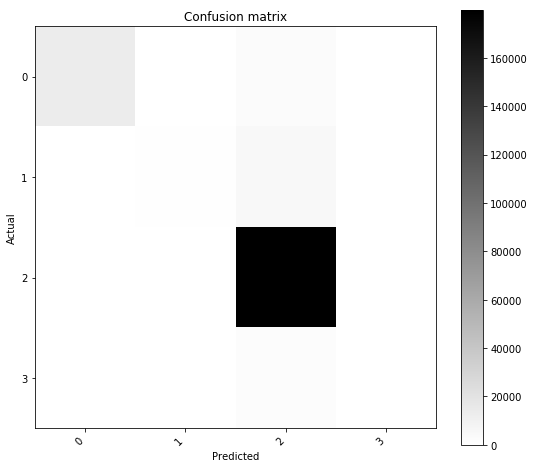

In [101]:
cm.plot()

In [102]:
model.save("model2.h5")

cm = confusion_matrix(y_target=y_test, 
                      y_predicted=y_pred, 
                      binary=False)

fig, ax = plot_confusion_matrix(conf_mat=cm)
plt.show()

#print("Confusion Matrix")
conf=confusion_matrix(y_test, y_pred)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(conf, classes=['CERTIFIED-WITHDRAWN','WITHDRAWN','CERTIFIED','DENIED'],
                      title='Confusion matrix, without normalization')